# Анализ картинок

Создайте эмбеддинги изображений и отобразите их в tensorboard projector'е

1. Скачайте датасет [CelebA](https://pytorch.org/vision/stable/datasets.html#celeba) или любой другой не рассмотренный на лекции
1. Выберите одну из предобученных [моделей torchvision](https://pytorch.org/vision/stable/models.html)
1. Создайте эмбеддинги изображений из датасета
1. Визуализируйте эмбеддинги в tensorboard projector

# Лена

Примените фильтр к изображению Лены

1. Скачайте изображение [Лены](http://optipng.sourceforge.net/pngtech/img/lena.png)
1. Найдите фильтр для выделения признака на изображении. В лекции показан пример фильтра Собеля. Использовать примеры с лекций нельзя. Начать поиск фильтра можно с [этой страницы](https://en.wikipedia.org/wiki/Feature_(computer_vision)#Extraction)
1. Реализуйте процедуру свёртки изображения с фильтром
1. Сверните Лену

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from platform import python_version
import cv2
import torch
import torchvision

import numpy as np
import matplotlib.pyplot as plt
import random
import numpy as np

import torch
import torch.nn as nn

import scipy

import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import SVHN
from torch.utils.data import DataLoader
from torchvision.models import resnet50

from tqdm.notebook import tqdm, trange

In [ ]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True


OUTPUT_DIM = 10 
EPOCH_NUM = 4 

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

DATA_DIR = "/content/drive/MyDrive/data/"

In [ ]:
basic_transform = transforms.Compose([
    transforms.Pad(4),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32),
    transforms.ToTensor()
])

In [ ]:
train_dataset = SVHN(
    root=DATA_DIR + 'SVHN/train',
    split='train',
    transform=basic_transform,
    download=True
)

test_dataset = SVHN(
    root=DATA_DIR + 'SVHN/test',
    split='test',
    transform=transforms.ToTensor(), 
    download=True
)

Using downloaded and verified file: /content/drive/MyDrive/data/SVHN/train/train_32x32.mat
Using downloaded and verified file: /content/drive/MyDrive/data/SVHN/test/test_32x32.mat


In [ ]:
dataloaders = {
    'train': DataLoader(
        dataset=train_dataset,
        batch_size=128, 
        shuffle=True
    ),
    'val': DataLoader(
        dataset=test_dataset,
        batch_size=128, 
        shuffle=False
    )
}

In [ ]:
class SVHNClassifier(nn.Module):
    def __init__(self, ouput_dim):
        super(SVHNClassifier, self).__init__()  # "Регистрируем" создаваемый объект как нейросетевую модель
        self.model = resnet50(pretrained=True)  # Скачиваем пред-обученную основу для нашей модели
        # https://www.mathworks.com/help/deeplearning/ref/resnet50.html;jsessionid=7745567c88d7e0ec10b14ffa7e03
        
        # "Замораживаем" все веса для ускорения обучения (мы считаем что они уже хорошо обучены)
        for param in self.model.parameters():
            param.requires_grad = False
        
        # Создаем "голову" которую мы и будем обучать
        self.fc1 = nn.Sequential(
            nn.Linear(1000, 64),
            nn.ReLU()
        )
        self.fc2 = nn.Sequential(
            nn.Dropout(0.25),
            nn.Linear(64, ouput_dim)
        )
    
    def embed(self, x):
        return self.fc1(self.model(x))
    
    # Описываем как именно наша модель будет генерировать предсказания
    def forward(self, x):
        resnet_out = self.embed(x)
        return self.fc2(resnet_out)

In [ ]:
model = SVHNClassifier(OUTPUT_DIM)
model = model.to(DEVICE)

# Создаем функцию ошибки (так как задача многоклассовой классификации, то используем кросс-энтропию)
# Более подробно об этом будет в курсе машинного обучения
loss_function = torch.nn.CrossEntropyLoss()

# Регистрируем для нашей модели способ изменения её весов
optimizer = torch.optim.Adam(model.parameters(), amsgrad=True, lr=1e-4)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [ ]:
loss_hist = {'train': [], 'val': []}
acc_hist = {'train': [], 'val': []}

# Важно! В данном примере точность используется для упрощения.
# Никогда не используйте её если у вас несбалансированная выборка
# Возьмите лучше F_score или ROC_AUC (об этом вам потом расскажут)

# Основной алгоритм обучения
for epoch in trange(EPOCH_NUM, desc='Whole pipeline'):
    
    for phase in ['train', 'val']:
        dataloader = dataloaders[phase]
        
        # Это условие необходимо так как у нас есть слой DropOut
        # И на валидации его принято фиксировать
        if phase == 'train':
            model.train() 
        elif phase == 'val':
            model.eval()
        
        running_loss = 0.
        running_acc = 0.
        
        # Проходимся по набору данных
        for (X_batch, y_batch) in tqdm(dataloader, desc=f'Epoch: {epoch + 1}. Phase: {phase}'):
            # Нормализуем наши данные
            X_batch = X_batch / 255
            X_batch = transforms.Normalize((0.811, 0.711, 0.871), (0.429, 0.324, 0.425))(X_batch)
            
            # Переносим на устройство
            X_batch = X_batch.to(DEVICE)
            y_batch = y_batch.to(DEVICE)
            
            # Для корректного обучения перед каждым шагом необходимо сбрасывать прошлые ошибки
            optimizer.zero_grad()
            
            with torch.set_grad_enabled(phase == 'train'):
                y_pred = model(X_batch)
                
                loss_value = loss_function(y_pred, y_batch)
                y_pred_class = y_pred.argmax(dim=1)
                
                if phase == 'train':
                    loss_value.backward()
                    optimizer.step()
                   
            running_loss += loss_value.item()
            running_acc += (y_pred_class == y_batch.data).float().mean().data.cpu().numpy()
        
        epoch_loss = running_loss / len(dataloader)
        epoch_acc = running_acc / len(dataloader)
        
        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f} ', end='')
        
        loss_hist[phase].append(epoch_loss)
        acc_hist[phase].append(epoch_acc)

Whole pipeline:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Phase: train:   0%|          | 0/573 [00:00<?, ?it/s]

train Loss: 2.2792 Acc: 0.1756 

Epoch: 1. Phase: val:   0%|          | 0/204 [00:00<?, ?it/s]

val Loss: 2.2239 Acc: 0.2141 

Epoch: 2. Phase: train:   0%|          | 0/573 [00:00<?, ?it/s]

train Loss: 2.2345 Acc: 0.1937 

Epoch: 2. Phase: val:   0%|          | 0/204 [00:00<?, ?it/s]

val Loss: 2.2080 Acc: 0.2178 

Epoch: 3. Phase: train:   0%|          | 0/573 [00:00<?, ?it/s]

train Loss: 2.2249 Acc: 0.1979 

Epoch: 3. Phase: val:   0%|          | 0/204 [00:00<?, ?it/s]

val Loss: 2.1996 Acc: 0.2253 

Epoch: 4. Phase: train:   0%|          | 0/573 [00:00<?, ?it/s]

train Loss: 2.2189 Acc: 0.2012 

Epoch: 4. Phase: val:   0%|          | 0/204 [00:00<?, ?it/s]

val Loss: 2.1907 Acc: 0.2286 

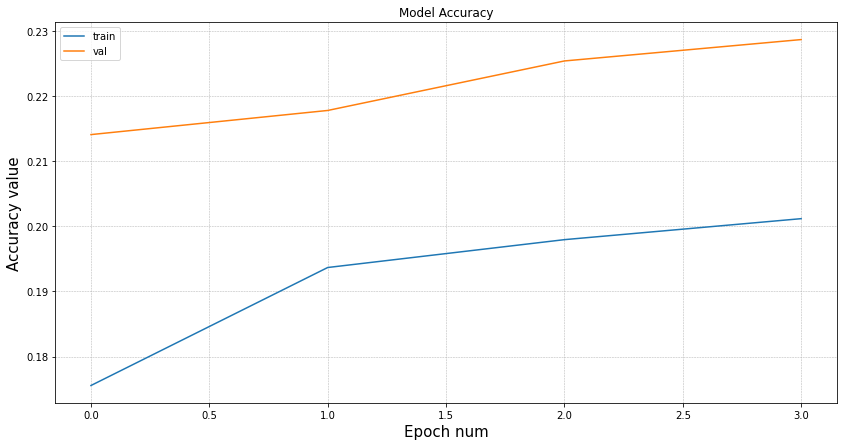

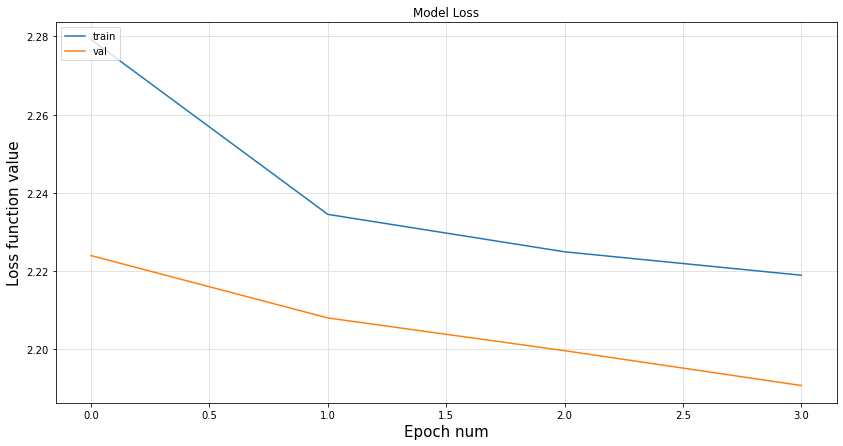

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in acc_hist.keys():
    plt.plot(acc_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model Accuracy')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('Accuracy value', fontsize=15)
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in loss_hist.keys():
    plt.plot(loss_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model Loss')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('Loss function value', fontsize=15)
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

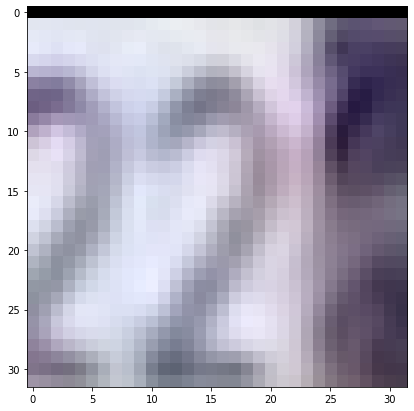

In [ ]:
img = train_dataset[40][0].detach().numpy()

plt.imshow(np.transpose(img, (1,2,0)))

## Создадим эмбединги изображений

In [ ]:
train_items = [train_dataset[i] for i in range(1000)]
xs, ys = zip(*train_items)
xs = torch.stack(xs)
xs = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))(xs)
xs = xs.cuda()
xs.size()

torch.Size([1000, 3, 32, 32])

In [ ]:
embs = model.embed(xs)
embs.size()

torch.Size([1000, 64])

In [ ]:
!pip install umap-learn
import umap
points = umap.UMAP().fit_transform(embs.cpu().detach().numpy())
points.shape

     |████████████████████████████████| 86 kB 2.9 MB/s 
     |████████████████████████████████| 1.1 MB 25.0 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=413cc874eb825418aec7527e30952651ab3683adc648912d646392add0884c00
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=db0c5ed3fdeb566ae1dfdbcda5417fab0832e4f3ba2b6ac33754de3a91419f4b
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


(1000, 2)

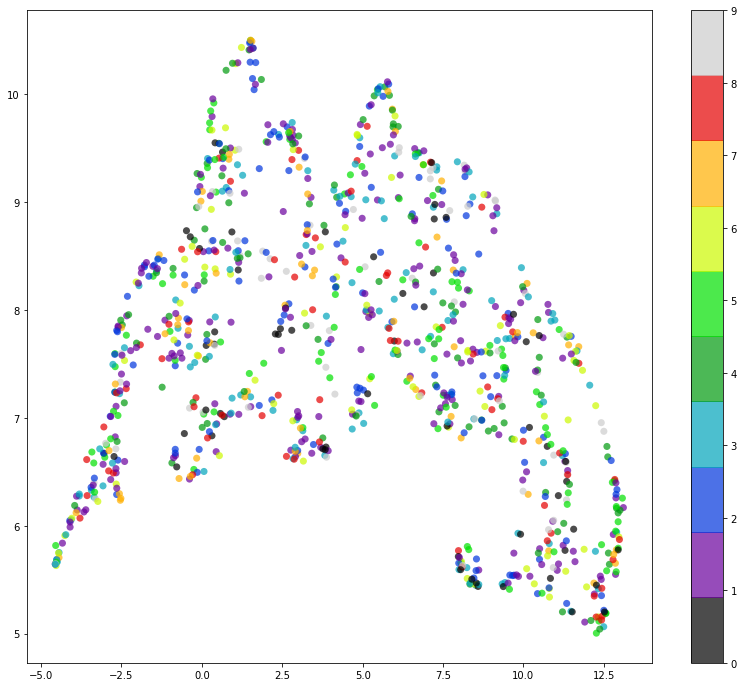

In [ ]:
plt.figure(figsize=(14,12))
plt.scatter(points[:, 0], points[:, 1], c=ys, 
            edgecolor='none', alpha=0.7, s=50,
            cmap=plt.cm.get_cmap('nipy_spectral', 10))
plt.colorbar()
plt.show()

In [ ]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter()

In [ ]:
# log embeddings

# fix from https://github.com/pytorch/pytorch/issues/30966#issuecomment-582747929
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

writer.add_embedding(embs,
                     metadata=ys,
                     label_img=xs)
writer.close()
print(len(ys))

1000


## Визуализируем эмбединги

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs --bind_all


<IPython.core.display.Javascript object>

## Лена

In [ ]:
  !curl http://optipng.sourceforge.net/pngtech/img/lena.png --output /content/drive/MyDrive/data/lena.png

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  462k  100  462k    0     0   462k      0  0:00:01  0:00:01 --:--:--  462k


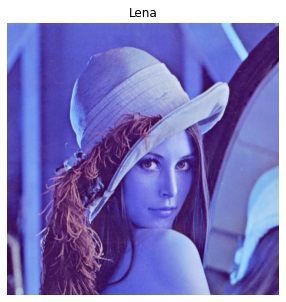

In [ ]:
img = cv2.imread(DATA_DIR + 'lena.png')  
plt.figure(figsize=(15, 5))
plt.title('Lena')
plt.imshow(img)
plt.axis('off')
plt.show()

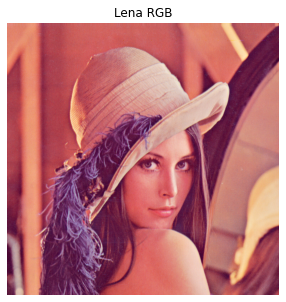

In [ ]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

plt.figure(figsize=(15, 5))
plt.title('Lena RGB')
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

## Воспользуемся фильтром Laplacian of Gaussian

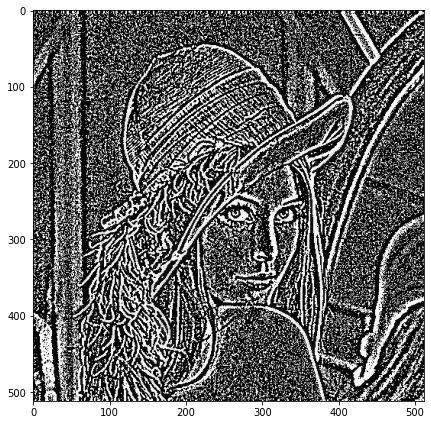

In [ ]:
# убираем шум
removed_blur = cv2.GaussianBlur(img, ksize=(5, 5), sigmaX=0)

# конвертируем в серый
gray = cv2.cvtColor(removed_blur, cv2.COLOR_BGR2GRAY)

# матрица Laplacian для 2D (https://en.wikipedia.org/wiki/Discrete_Laplace_operator#Implementation_via_operator_discretization)
kernel = np.array([[0.25, 0.5, 0.25],[0.5, -3, 0.5],[0.25, 0.5, 0.25]])

from scipy.ndimage import convolve

img_conv=convolve(gray, kernel)
plt.figure(figsize=(7, 10))
plt.imshow(img_conv, cmap='gray')

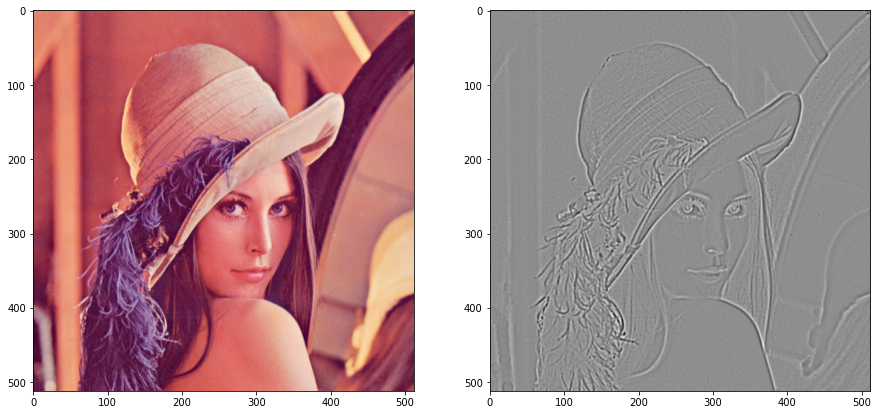

In [ ]:
laplacian = cv2.Laplacian(gray, cv2.CV_16S, ksize=3)

plt.figure(figsize=(15, 10))

ax = plt.subplot(121)
ax.imshow(img_rgb)

ax = plt.subplot(122)
ax.imshow(laplacian, cmap='gray');